# Import library yang dibutuhkan

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
import plotly.express as px

# Import data CSV

In [2]:
df = pd.read_csv("covid-vaccination-vs-death_ratio.csv")
df.head()

,Unnamed: 0,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,New_deaths,population,ratio
0,0,Afghanistan,AFG,2021-05-11,504502.0,448878.0,55624.0,12,40295077.0,1.113977
1,1,Afghanistan,AFG,2021-05-20,547901.0,470341.0,77560.0,10,40295077.0,1.167242
2,2,Afghanistan,AFG,2021-05-24,573277.0,476367.0,96910.0,10,40295077.0,1.182197
3,3,Afghanistan,AFG,2021-05-26,590454.0,479372.0,111082.0,19,40295077.0,1.189654
4,4,Afghanistan,AFG,2021-05-27,593313.0,479574.0,113739.0,14,40295077.0,1.190155


In [3]:
pd.set_option('display.max_rows',100)
df.head(100)

,Unnamed: 0,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,New_deaths,population,ratio
0,0,Afghanistan,AFG,2021-05-11,504502.0,448878.0,55624.0,12,40295077.0,1.113977
1,1,Afghanistan,AFG,2021-05-20,547901.0,470341.0,77560.0,10,40295077.0,1.167242
2,2,Afghanistan,AFG,2021-05-24,573277.0,476367.0,96910.0,10,40295077.0,1.182197
3,3,Afghanistan,AFG,2021-05-26,590454.0,479372.0,111082.0,19,40295077.0,1.189654
4,4,Afghanistan,AFG,2021-05-27,593313.0,479574.0,113739.0,14,40295077.0,1.190155
5,5,Afghanistan,AFG,2021-05-30,600152.0,480226.0,119926.0,20,40295077.0,1.191773
6,6,Afghanistan,AFG,2021-06-02,626290.0,481690.0,144600.0,34,40295077.0,1.195407
7,7,Afghanistan,AFG,2021-06-03,630305.0,481800.0,148505.0,27,40295077.0,1.195680
8,8,Afghanistan,AFG,2021-06-08,641295.0,482952.0,158343.0,64,40295077.0,1.198538
9,9,Afghanistan,AFG,2021-06-14,662003.0,484737.0,177266.0,85,40295077.0,1.202968


# Data Understanding

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26623 entries, 0 to 26622
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               26623 non-null  int64  
 1   country                  26623 non-null  object 
 2   iso_code                 26623 non-null  object 
 3   date                     26623 non-null  object 
 4   total_vaccinations       26623 non-null  float64
 5   people_vaccinated        26623 non-null  float64
 6   people_fully_vaccinated  26623 non-null  float64
 7   New_deaths               26623 non-null  int64  
 8   population               26623 non-null  float64
 9   ratio                    26623 non-null  float64
dtypes: float64(5), int64(2), object(3)
memory usage: 2.0+ MB


In [5]:
df.describe()

,Unnamed: 0,total_vaccinations,people_vaccinated,people_fully_vaccinated,New_deaths,population,ratio
count,26623.000000,2.662300e+04,2.662300e+04,2.662300e+04,26623.000000,2.662300e+04,26623.000000
mean,13311.000000,2.624900e+07,1.587149e+07,1.015975e+07,104.341584,5.068306e+07,36.058352
std,7685.542445,9.172916e+07,5.852142e+07,3.409173e+07,343.701812,1.585035e+08,27.286028
min,0.000000,1.000000e+00,1.000000e+00,1.000000e+00,-92.000000,1.373000e+03,0.000011
25%,6655.500000,6.062655e+05,4.006990e+05,1.765970e+05,1.000000,3.354825e+06,9.940602
50%,13311.000000,3.570392e+06,2.248865e+06,1.169177e+06,10.000000,1.034502e+07,32.817733
75%,19966.500000,1.560763e+07,8.804162e+06,5.698058e+06,52.000000,3.823269e+07,60.421409
max,26622.000000,2.422908e+09,1.225000e+09,1.076308e+09,8786.000000,1.446645e+09,122.149682


In [6]:
df.isnull().sum()

Unnamed: 0                 0
country                    0
iso_code                   0
date                       0
total_vaccinations         0
people_vaccinated          0
people_fully_vaccinated    0
New_deaths                 0
population                 0
ratio                      0
dtype: int64

In [7]:
df.shape

(26623, 10)

# Data Preparation / Explanatory Data Analysis (EDA)

## Drop kolom Unnamed: 0

In [8]:
df.drop(columns=["Unnamed: 0"], axis=1, inplace=True)

In [9]:
df.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,New_deaths,population,ratio
0,Afghanistan,AFG,2021-05-11,504502.0,448878.0,55624.0,12,40295077.0,1.113977
1,Afghanistan,AFG,2021-05-20,547901.0,470341.0,77560.0,10,40295077.0,1.167242
2,Afghanistan,AFG,2021-05-24,573277.0,476367.0,96910.0,10,40295077.0,1.182197
3,Afghanistan,AFG,2021-05-26,590454.0,479372.0,111082.0,19,40295077.0,1.189654
4,Afghanistan,AFG,2021-05-27,593313.0,479574.0,113739.0,14,40295077.0,1.190155


## Mengubah tipe data date dari object menjadi datetime

In [10]:
df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d', errors='ignore')

In [11]:
column_name = ["total_vaccinations","people_vaccinated","people_fully_vaccinated","population"]
df[column_name] = df[column_name].astype(int)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26623 entries, 0 to 26622
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   country                  26623 non-null  object        
 1   iso_code                 26623 non-null  object        
 2   date                     26623 non-null  datetime64[ns]
 3   total_vaccinations       26623 non-null  int32         
 4   people_vaccinated        26623 non-null  int32         
 5   people_fully_vaccinated  26623 non-null  int32         
 6   New_deaths               26623 non-null  int64         
 7   population               26623 non-null  int32         
 8   ratio                    26623 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int32(4), int64(1), object(2)
memory usage: 1.4+ MB


### Penjelasan variabel

- **country** ==> Nama negara (198 Negara)            
- **iso_code** ==> sistem pengkodean standar untuk nama negara (198 Negara)                  
- **date** ==> Tanggal  (2021-05-11 ==> 2021-12-26)              
- **total_vaccinations** ==> Total Vaksin yang sudah digunakan        
- **people_vaccinated**  ==> Total orang yang sudah vaksin 1
- **people_fully_vaccinated**  ==> Total orang yang sudah 2 kali vaksin       
- **New_deaths**  ==> Jumlah kematian                   
- **population**  ==> Jumlah Populasi                 
- **ratio**    ==> persentase vaksinasi di sebuah negara = people_vaccinated/population * 100

#### Mengecek berapa jumlah negara dan iso code yang terdaftar

In [13]:
len(df['country'].unique())

198

In [14]:
len(df['iso_code'].unique())

198

#### Mengecek tanggal diambilnya data

In [15]:
tanggal = df['date'].unique()
print(tanggal)

['2021-05-11T00:00:00.000000000' '2021-05-20T00:00:00.000000000'
 '2021-05-24T00:00:00.000000000' '2021-05-26T00:00:00.000000000'
 '2021-05-27T00:00:00.000000000' '2021-05-30T00:00:00.000000000'
 '2021-06-02T00:00:00.000000000' '2021-06-03T00:00:00.000000000'
 '2021-06-08T00:00:00.000000000' '2021-06-14T00:00:00.000000000'
 '2021-06-22T00:00:00.000000000' '2021-06-27T00:00:00.000000000'
 '2021-06-30T00:00:00.000000000' '2021-07-05T00:00:00.000000000'
 '2021-07-07T00:00:00.000000000' '2021-07-11T00:00:00.000000000'
 '2021-08-20T00:00:00.000000000' '2021-11-14T00:00:00.000000000'
 '2021-11-20T00:00:00.000000000' '2021-11-27T00:00:00.000000000'
 '2021-02-02T00:00:00.000000000' '2021-02-09T00:00:00.000000000'
 '2021-02-17T00:00:00.000000000' '2021-02-18T00:00:00.000000000'
 '2021-02-22T00:00:00.000000000' '2021-05-12T00:00:00.000000000'
 '2021-05-13T00:00:00.000000000' '2021-05-14T00:00:00.000000000'
 '2021-05-17T00:00:00.000000000' '2021-05-18T00:00:00.000000000'
 '2021-05-19T00:00:00.000

In [38]:
# ratio function
def ratio_population(variabel):
    df_variabel = df.groupby('country').agg({variabel:max})
    sum_variabel = df_variabel[variabel].sum()

    df_country = df.groupby('country').agg({'population':max})
    total_population = df_country['population'].sum()
    
    title = 'Ratio of '+variabel

    plt.figure(figsize=(10,5),dpi=100)
    plt.pie(
        [total_population,sum_variabel],
        autopct='%.2F%%',
        labels=['total_population',variabel],
        colors = ["#E02401","#F78812"],
        explode=(0,0.1))
    plt.title(title)
    plt.show()
    

# Ratio of people fully vaccinated

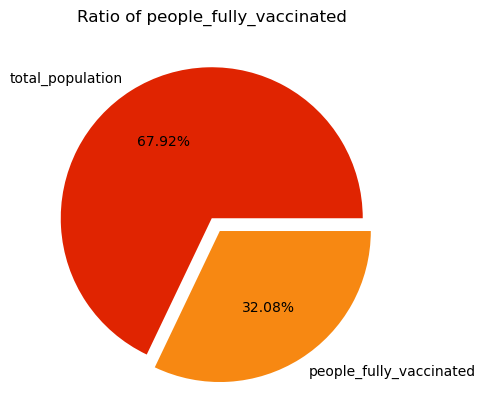

In [39]:
ratio_population('people_fully_vaccinated')

# Ratio of people vaccinated

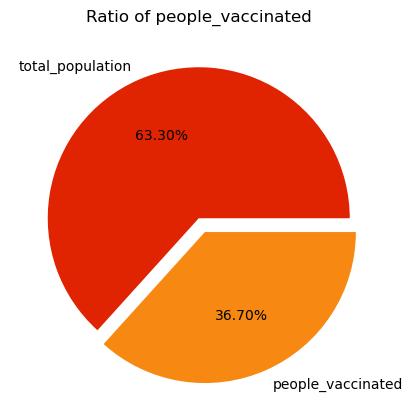

In [40]:
ratio_population('people_vaccinated')

# Ratio of total vaccinated

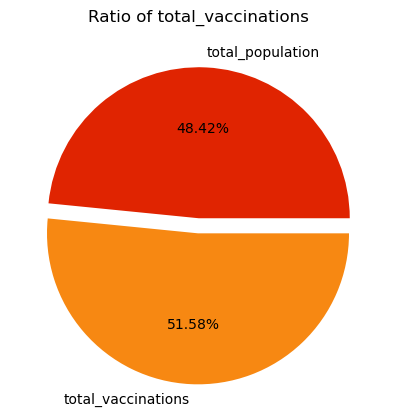

In [41]:
ratio_population('total_vaccinations')

# TreeMap 
#### by people_vaccinated, people_fully_vaccinated, population & total_vacination

In [19]:
df_country = df.groupby('country').agg({'people_vaccinated':max, 'population':max, 'population':max, 'total_vaccinations':max, 'people_fully_vaccinated':max})
df_country = df_country.reset_index()

In [45]:
def treeMapBreakdownbyCountry(variabel):
    title = "Total "+variabel+" Breakdown by Country"
    fig = px.treemap(df_country, path=["country"],values=variabel, height = 750,
                     title=title,
                     color_discrete_sequence = px.colors.qualitative.Set3)

    fig.update_traces(textinfo = "label+text+value")
    fig.show()
    

In [43]:
treeMapBreakdownbyCountry("people_vaccinated")

In [46]:
treeMapBreakdownbyCountry("people_fully_vaccinated")

In [47]:
treeMapBreakdownbyCountry("population")

In [48]:
treeMapBreakdownbyCountry("total_vaccinations")

# Tree Map by total death

In [52]:
df_country_by_death = df.groupby('country').agg({'New_deaths':sum})
df_country_by_death = df_country_by_death.reset_index()    


fig = px.treemap(df_country_by_death, path=["country"],values="New_deaths", height = 750,
                 title="Total Death Breakdown by Country",
                 color_discrete_sequence = px.colors.qualitative.Set3)

fig.update_traces(textinfo = "label+text+value")
fig.show()

# Geo Map by Date per Country 

In [53]:
New_deaths_df = df[['date', 'country', 'New_deaths']].sort_values('date')
New_deaths_df = New_deaths_df[New_deaths_df.New_deaths > 0]
New_deaths_df['log2(New_deaths)'] = np.log2(New_deaths_df['New_deaths'])
New_deaths_df['date'] = New_deaths_df['date'].dt.strftime('%m/%d/%Y')

fig = px.choropleth(New_deaths_df, locations="country", locationmode='country names',
                    color="log2(New_deaths)", hover_name="country", hover_data=['New_deaths'],
                    projection="natural earth", animation_frame="date",
                    title='<b>Coronavirus Global New_deaths Over Time</b>',
                    color_continuous_scale="reds",
                   )

fig.update_layout(coloraxis={"colorbar": {"title":"<b>New_deaths</b><br>",
                                          "titleside":"top",
                                          "tickmode":"array"}
                            }
                 )

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 10
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 2

fig.show()

In [56]:
total_vaccinations_df = df[['date', 'country', 'total_vaccinations']].sort_values('date')
total_vaccinations_df = total_vaccinations_df[total_vaccinations_df.total_vaccinations > 0]
total_vaccinations_df['log2(total_vaccinations)'] = np.log2(total_vaccinations_df['total_vaccinations'])
total_vaccinations_df['date'] = total_vaccinations_df['date'].dt.strftime('%m/%d/%Y')

fig = px.choropleth(total_vaccinations_df, locations="country", locationmode='country names',
                    color="log2(total_vaccinations)", hover_name="country", hover_data=['total_vaccinations'],
                    projection="natural earth", animation_frame="date",
                    title='<b>Coronavirus Global total_vaccinations Over Time</b>',
                    color_continuous_scale="greens",
                   )

fig.update_layout(coloraxis={"colorbar": {"title":"<b>total_vaccinations</b><br>",
                                          "titleside":"top",
                                          "tickmode":"array"}
                            }
                 )

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 10
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 2

fig.show()

# Visualization per Country

In [24]:
# Memisahkan setiap negara menjadi 1 csv
filter_country = df['country'].unique()
filter_country = list(filter_country)

for i in filter_country:
    data_percountry = df.where(df['country'] == i)
    data_percountry.dropna(inplace=True)
    data_percountry.to_csv(i+".csv")

In [57]:
def linechart(x, y1, title):
    fig, ax1 = plt.subplots(1,1,figsize=(16,9), dpi= 80)
    ax1.plot(x,y1,color='tab:red')

    ax1.set_xlabel('date',fontsize=20)
    ax1.tick_params(axis='x',rotation=0,labelsize=12)
    ax1.set_ylabel(title,color='tab:red',fontsize=20)
    ax1.tick_params(axis='y',rotation=0,labelcolor='tab:red')
    ax1.grid(alpha=0.4)

In [67]:
def call_country_and_draw_line_chart(country_name):
    csv_name = country_name+".csv"
    df_country = pd.read_csv(csv_name)
    df_country.drop(columns=["Unnamed: 0"], axis=1, inplace=True)
    df_country['date'] = pd.to_datetime(df_country['date'], format = '%Y-%m-%d', errors='ignore')
    column_name = ["total_vaccinations","people_vaccinated","people_fully_vaccinated","population","New_deaths"]
    df_country[column_name] = df_country[column_name].astype(int)
    
    x = df_country['date']
    y1 = df_country['total_vaccinations']
    y2 = df_country['New_deaths']
    y3 = df_country['people_vaccinated']
    y4 = df_country['people_fully_vaccinated']
    
    print("--"+country_name+"--")
    linechart(x, y1, 'total_vaccinations')
    linechart(x, y2, 'New_deaths')
    linechart(x, y3, 'people_vaccinated')
    linechart(x, y4, 'people_fully_vaccinated')

In [68]:
# name of Country
df['country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia (Plurinational State of)',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi',
       'Cambodia', 'Cameroon', 'Canada', 'Cabo Verde', 'Cayman Islands',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba',
       'Curaçao', 'Cyprus', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
       'Equatorial Guinea', 'Estonia', 'Ethiopia',
       'Falkland Islands (Malvinas)', 'Fiji', 'Finland', 'France',
       'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany',
       

--Indonesia--


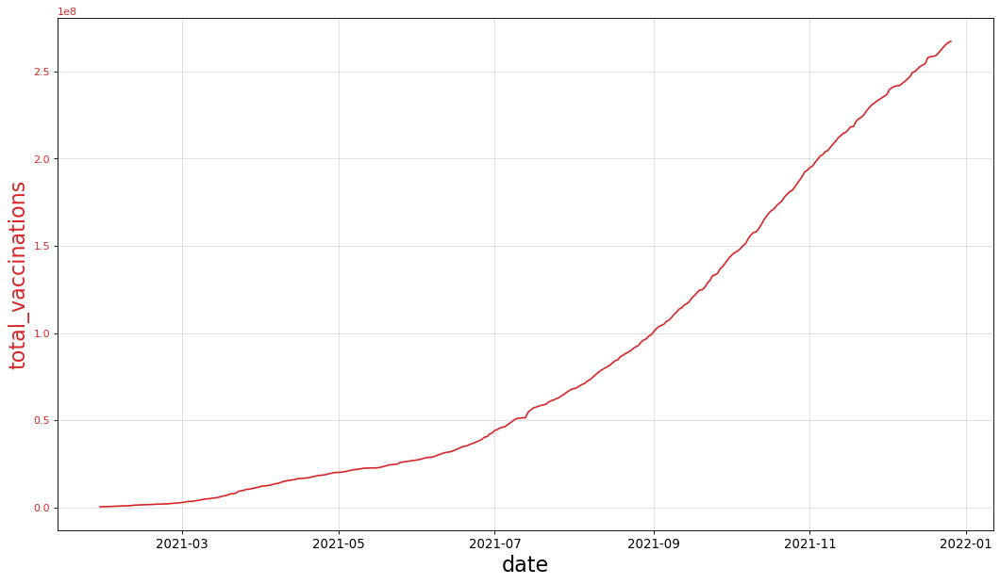

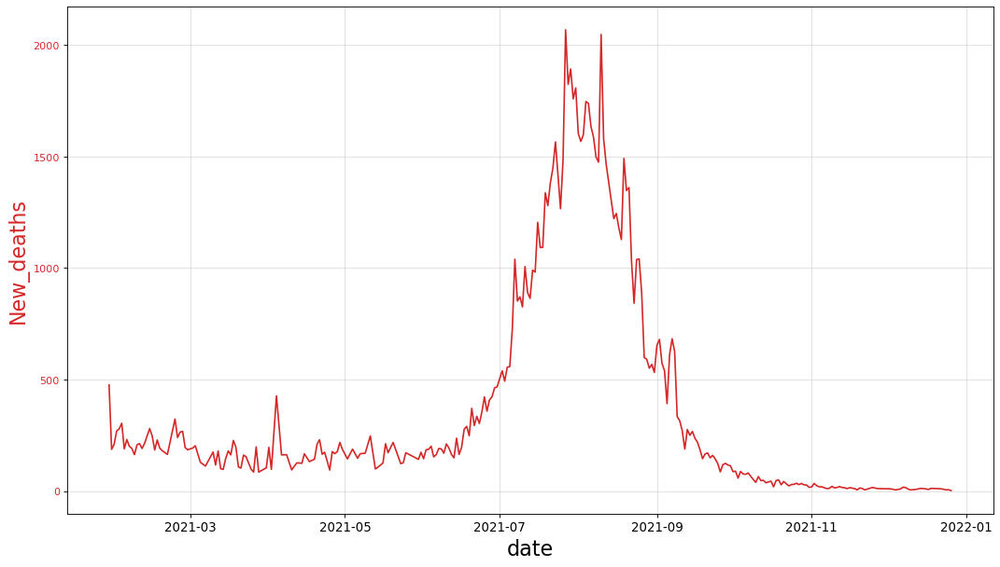

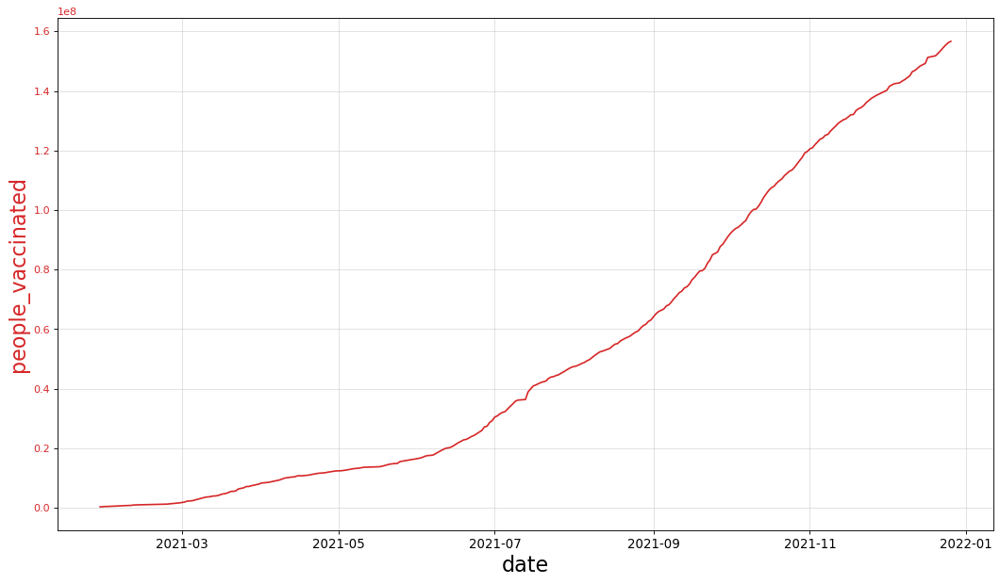

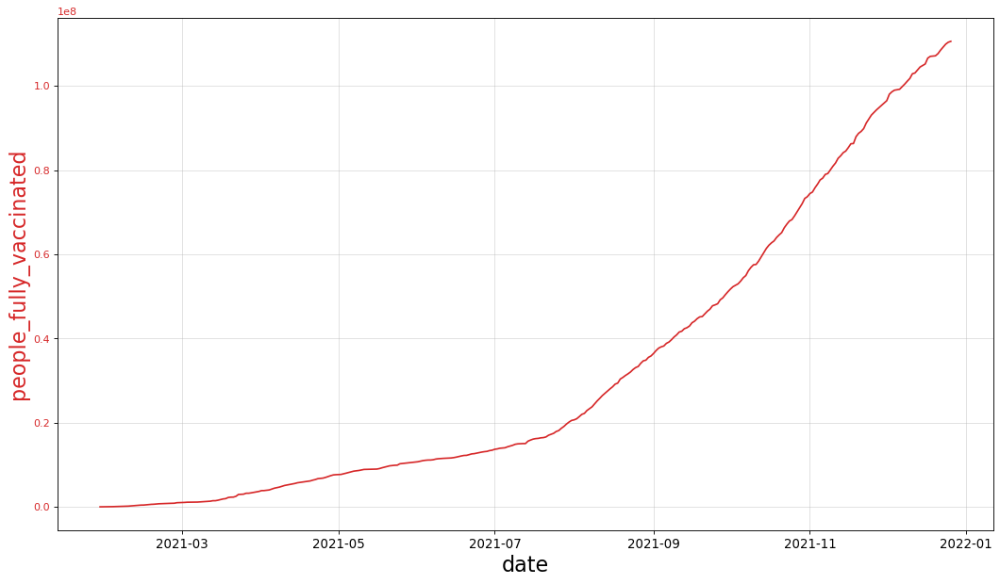

In [69]:
call_country_and_draw_line_chart("Indonesia")

--United Arab Emirates--


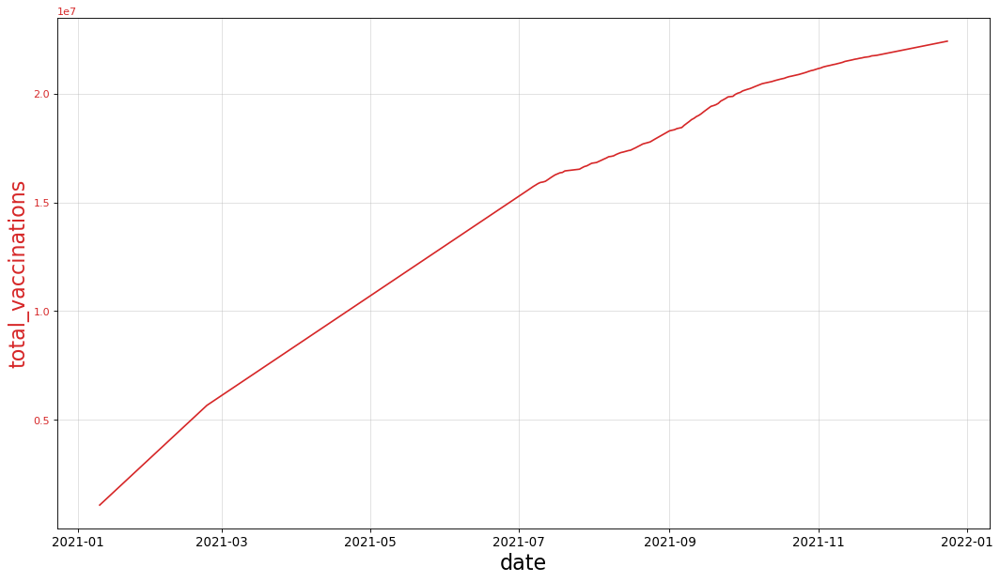

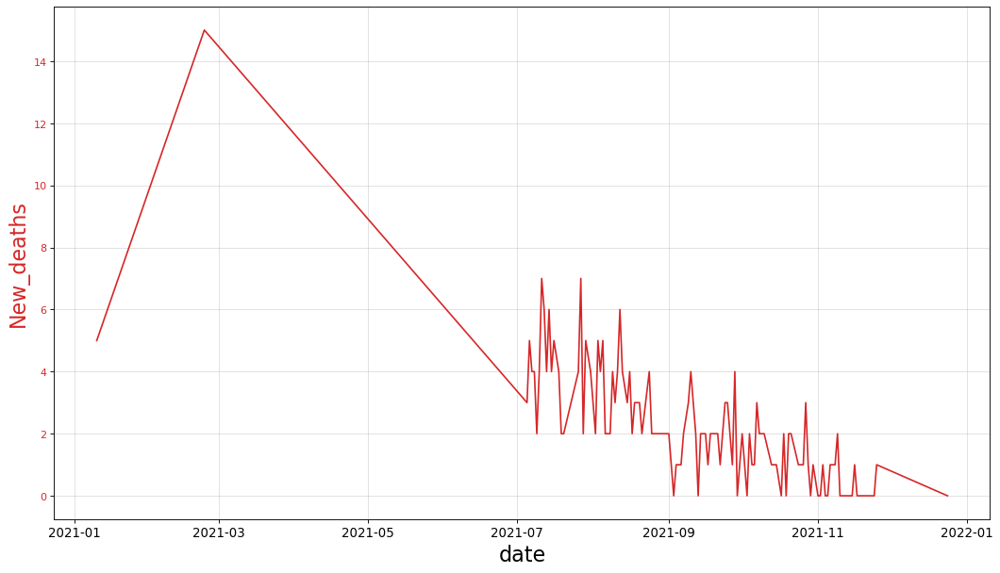

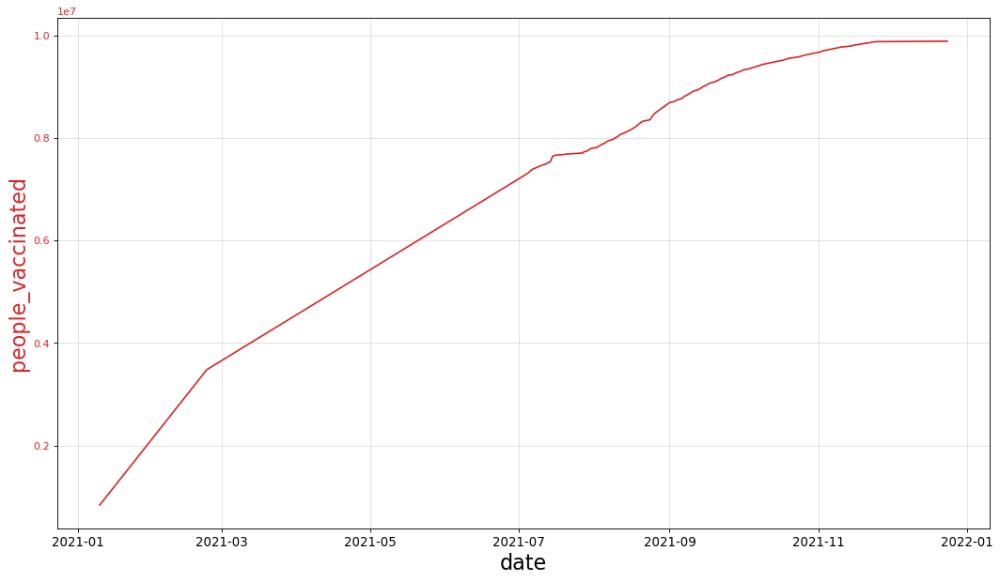

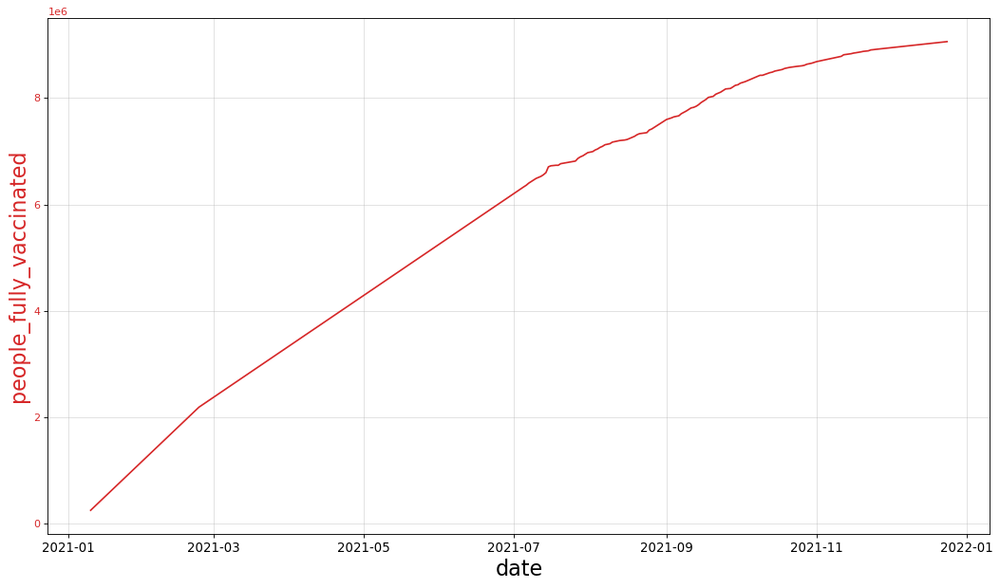

In [70]:
call_country_and_draw_line_chart('United Arab Emirates')